In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
import pandas as pd

class ProcessAmazon():
    """Read, filter, aggregate by ProductId, and generate X matrix"""

    def __init__(self, raw_data_filename, num_reviews_filter):
        """Initialize attributes."""
        self.raw_data_filename = raw_data_filename
        self.num_reviews_filter = num_reviews_filter
        self.raw_data = self.read_and_report()
        self.grouped_by_userid = self.group_by_userid()
#         self.grouped_by_Helpful = self.grouped_by_Helpful()
        self.filtered = self.filter_()
        self.grouped_by_productid = self.group_by_productid()
        self.X = self.write_X()
    
    def read_and_report(self):
        """Read Amazon csv, report on file structure"""
        data = pd.read_csv(self.raw_data_filename)
        print(self.raw_data_filename, "has", data.shape[0], "rows and", data.shape[1], "columns. First five observations:")
        (data.head(5))
        print(50 * '-')
        return data
    
    def group_by_userid(self):
        """Group by UserId and look at the distribution of number of reviews"""
        grouped_by_uid = self.raw_data.groupby('UserId').count()
        print('Distribution of number of reviews for each UserId:')
        print(grouped_by_uid['ProductId'].value_counts())
        print(50 * '-')
        return grouped_by_uid
    
#     add on another feature that might help 
    def grouped_by_Helpful(self):
        """grouped_by_Helpful and look at the distribution of number of reviews"""
        grouped_by_Helpful = self.raw_data.groupby('helpful').count()
        print('Distribution of number of reviews for each UserId:')
        print(grouped_by_Helpful['helpful'].value_counts())
        print(50 * '-')
        return grouped_by_Helpful
    
    def filter_(self):
        """Filter out reviewers with fewer than x reviews"""
        filtered = self.grouped_by_userid[self.grouped_by_userid['Id'] > self.num_reviews_filter]
        # remove unhelpful comments 
#         filtered2 = self.grouped_by_Helpful[self.grouped_by_Helpful['helpful'] : FALSE]
         # remove redundant columns
        filtered_final = filtered.drop(filtered.columns[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]], axis=1)
        # recreate UserId from index
        filtered_final['UserId'] = filtered_final.index
        # rename columns
        filtered_final.columns = ['num_reviews', 'UserId']
        filtered_final.reset_index(drop=True, inplace=True)
        # left merge filtered list with raw data
        filtered = pd.merge(filtered_final, self.raw_data, how='left', on='UserId')
        print("Filtered data has", filtered.shape[0], "rows and", filtered.shape[1], "columns. First five observations:")
        print(filtered.head(5))
        print(50 * '-')
        return filtered


    
    def group_by_productid(self):
        """Group by ProductId and create a column that lists each UserId (separated by spaces) who reviewed that product"""
        grouped_by_pid = self.filtered.groupby('ProductId')['UserId'].apply(lambda x: ' '.join(x)).reset_index()
        print("Data grouped by ProductId has", grouped_by_pid.shape[0], "rows and", grouped_by_pid.shape[1], "columns. First five observations:")
        print(grouped_by_pid.head(5))
        print(50 * '-')
        return grouped_by_pid
    
    
#     def train_test(self):
#         #Train-Test split
#         X=self['helpScore'].values
#         Y=self['Score'].values
#         from sklearn.model_selection import train_test_split
#         X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.3) #random splitting
#         X_train,X_cv,Y_train,Y_cv=train_test_split(X_train,Y_train,test_size=0.3) #random splitting
#         print(X_train.shape,Y_train.shape)
#         print(X_test.shape,Y_test.shape)
#         print(X_cv.shape,Y_cv.shape)
    
    def write_X(self):
        """use bag of words to create boolean X to represent reviews by UserId (one UserId per column)"""
        #featurization_using_Bow
        from sklearn.feature_extraction.text import CountVectorizer
        count = CountVectorizer()
        uidArray = self.grouped_by_productid.UserId
        userFeatures = count.fit_transform(uidArray)
        print("Shape of final X matrix:", userFeatures.shape)
        return userFeatures


In [71]:
import pandas as pd
import matplotlib.cm as cm


from sklearn.metrics import silhouette_samples, silhouette_score
from wordcloud import WordCloud
# from yellowbrick.cluster import SilhouetteVisualizer


    
class ViewClusteringResults():
    """Merge cluster definitions to raw data and view samples of clustering results, showing review summaries and texts."""
    
    def __init__(self, data_instance, model_instance):
        """Initialize attributes"""
        self.data_instance = data_instance
        self.model_instance = model_instance
    
    def merge_labels(self):
        """Merge cluster labels to raw data (as structured in Amazon.csv)"""
        labels_tomerge = pd.DataFrame(self.model_instance.labels_)
        labelled_products = pd.concat([self.data_instance.grouped_by_productid, labels_tomerge], axis=1, ignore_index=True)
        labelled_products.columns = ['ProductId', 'UserIds','cluster']
        merged = pd.merge(labelled_products, self.data_instance.raw_data, how='left', on='ProductId')
#         merged_lite = merged[['ProductId', 'cluster', 'Summary', 'Text','helpful']]
        merged_lite = merged[['ProductId', 'cluster', 'Text']]
        return merged_lite

    def view_cluster_samples(self, n_samples):
        """Print x samples of cluster results for each cluster, showing details of product reviews."""
        merged = self.merge_labels()
        num_clusters = self.model_instance.cluster_centers_.shape[0]
        for i in range(1, num_clusters): 
            print(50 * '-')
            print('cluster: ', i)
            cluster = merged.loc[merged['cluster'] == i]
            print('cluster size: ', cluster.shape)
            print(cluster.sample(n_samples))
    
    def onlysize(self, n_samples):
        """Print x samples of cluster results for each cluster, showing details of product reviews."""
        merged = self.merge_labels()
        num_clusters = self.model_instance.cluster_centers_.shape[0]
        for i in range(1, num_clusters): 
            cluster = merged.loc[merged['cluster'] == i]
            print('cluster: ', i)
            print('cluster size: ', cluster.shape)
            
    def gettopic(self, n_samples):
        merged = self.merge_labels()
        num_clusters = self.model_instance.cluster_centers_.shape[0]
        for i in range(1, num_clusters): 
            print(f"Cluster {i} Topic:", end=" ")
            
            cluster = merged.loc[merged['cluster'] == i]
            reviews = cluster.sample(n_samples)
            response = openai.Completion.create(
                engine="davinci-instruct-beta-v3",
#                 prompt=f"What do the following product reviews have in common?\n\nReviews:\n\"\"\"\n{reviews}\n\"\"\"\n\nTopic:",
                prompt=f"What is the product that the following reviews talk about?\n\nReviews:\n\"\"\"\n{reviews}\n\"\"\"\n\nTopic:",
                temperature=0,
                max_tokens=64,
                top_p=1,
                frequency_penalty=0,
                presence_penalty=0,
                timeout = 60
            )
            print(response["choices"][0]["text"].replace('\n',''))
            
    def silhouette(self,n_samples):
        fig, ax = plt.subplots(2, 2, figsize=(15,8))
        merged = self.merge_labels()
        num_clusters = self.model_instance.cluster_centers_.shape[0]
        for i in range(1, num_clusters): 
            '''
            Create KMeans instance for different number of clusters
            '''
            km = KMeans(num_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
            q, mod = divmod(i, 2)
            '''
            Create SilhouetteVisualizer instance with KMeans instance
            Fit the visualizer
            '''
            visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
            visualizer.fit(X)


            
    def wordcloud(self, n_samples):
        merged = self.merge_labels()
        num_clusters = self.model_instance.cluster_centers_.shape[0]
        for i in range(1, num_clusters): 
#             cluster = list_of_words_str.loc[list_of_words_str['cluster'] == i]
            cluster = merged.loc[merged['cluster'] == i]
            des = cluster.sample(n_samples).Text
            list_of_words_str = ' '.join(des)
            wc = WordCloud(background_color="white", max_words=len(list_of_words_str),width=1080, height=720,min_font_size = 8, collocations=False)
            wc.generate(list_of_words_str)
            plt.figure(figsize=(10,10))
            print('cluster: ', i)
            print ("\n\nWord Cloud for Important features")
            plt.imshow(wc, interpolation='bilinear')
            plt.axis("off")
            plt.show()


In [4]:
# process Amazon.csv, filtering out people who left 4 or fewer reviews
amazonData = ProcessAmazon('/Users/toeyscn/Downloads/ml-master/final_assignment_3/final_assignment_3/Data/Amazon.csv', 4)

/Users/toeyscn/Downloads/ml-master/final_assignment_3/final_assignment_3/Data/Amazon.csv has 455000 rows and 13 columns. First five observations:
   Unnamed: 0      Id   ProductId          UserId       ProfileName  \
0      138806  138807  B000E63LME  A1CQGW1AOD0LF2  Alena K. "Alena"   
1      469680  469681  B004ZIH4KM  A37S7U1OX2MCWI        Becky Cole   
2      238202  238203  B003ZXE9QA  A2OM6G73E64EQ9              jeff   
3      485307  485308  B001RVFERK  A25W349EE97NBK          Tangent4   
4      375283  375284  B000OQZNTS  A3CPPW0HUC07YS       Amy Nicolai   

   HelpfulnessNumerator  HelpfulnessDenominator  Score        Time  \
0                     1                       2      2  1294185600   
1                     0                       0      5  1349740800   
2                     0                       0      5  1329264000   
3                     1                       1      4  1248307200   
4                     0                       0      5  1333238400   

      

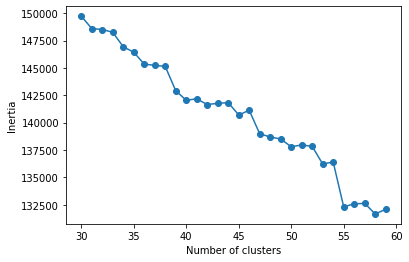

In [48]:
# first attempt at fitting K means to view change in Inertia
from sklearn.cluster import KMeans

# container to store inertia scores over iterations
distortions = []

# fit KMeans iteratively to begin to assess the appropriate number of clusters
for i in range(30,60):
    km = KMeans(n_clusters=i)
    km.fit(amazonData.X)
    distortions.append(km.inertia_)
    
# vizualize change in inertia
plt.plot(range(30, 60), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [53]:
# fit KMeans with 100 clusters
from sklearn.cluster import KMeans
optimal_k= 55
kmeans = KMeans(n_clusters=optimal_k)
kmeans.fit(amazonData.X)

KMeans(n_clusters=55)

In [72]:
# create an instance of ViewClusteringResults to view results of final KMeans fit
viz = ViewClusteringResults(amazonData, kmeans)

In [55]:
 """view samples of product reviews, organized by KMeans cluster results (N-clusters = 1500) """
viz.view_cluster_samples(10)

--------------------------------------------------
cluster:  1
cluster size:  (3445, 3)
         ProductId  cluster                                               Text
135940  B0014ATRV8        1  I wanted good quality, fresh chamomile tea.  T...
9372    B00020HHHC        1  After reading reviews from baby sites, I was r...
142460  B00188S3PM        1  I ordered this to serve at a "tea" where I was...
290334  B00412W76S        1  I've a difficult time drinking red raspberry l...
8935    B00020HHAO        1  I usually dont like black herbal tea, but this...
95350   B000M0F58U        1  In ayurvedic medidicne and in yoga exxercises ...
136094  B0014AUJII        1  Helped when I had a cold and soar throat and c...
8904    B00020HHAO        1  This is an outstanding product!! The test is g...
139706  B0016B7Z32        1  Helped when I had a cold and soar throat and c...
136321  B0014B0HWK        1  This is a good tasting tea at a great price. I...
-------------------------------------------

102715  B000P52FLW       54  This is a great price for a healthy food for m...


In [56]:
 """view number of nodes in each cluster for (N-clusters = 1500)"""
viz.onlysize(10)

cluster:  1
cluster size:  (3445, 3)
cluster:  2
cluster size:  (1262, 3)
cluster:  3
cluster size:  (4097, 3)
cluster:  4
cluster size:  (1012, 3)
cluster:  5
cluster size:  (2059, 3)
cluster:  6
cluster size:  (470, 3)
cluster:  7
cluster size:  (898, 3)
cluster:  8
cluster size:  (711, 3)
cluster:  9
cluster size:  (3270, 3)
cluster:  10
cluster size:  (1021, 3)
cluster:  11
cluster size:  (1456, 3)
cluster:  12
cluster size:  (1102, 3)
cluster:  13
cluster size:  (1326, 3)
cluster:  14
cluster size:  (18238, 3)
cluster:  15
cluster size:  (2481, 3)
cluster:  16
cluster size:  (1644, 3)
cluster:  17
cluster size:  (1323, 3)
cluster:  18
cluster size:  (153, 3)
cluster:  19
cluster size:  (765, 3)
cluster:  20
cluster size:  (2485, 3)
cluster:  21
cluster size:  (1756, 3)
cluster:  22
cluster size:  (378, 3)
cluster:  23
cluster size:  (1697, 3)
cluster:  24
cluster size:  (120, 3)
cluster:  25
cluster size:  (1513, 3)
cluster:  26
cluster size:  (2553, 3)
cluster:  27
cluster size: 

cluster:  1


Word Cloud for Important features


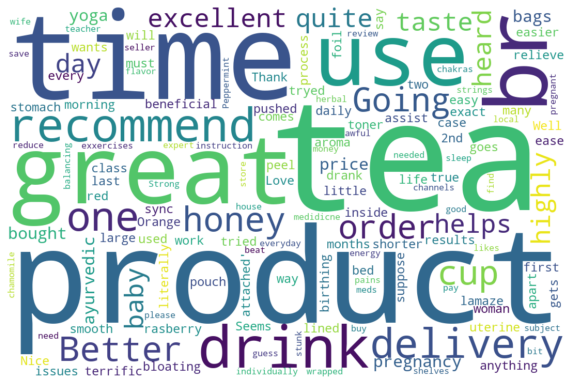

cluster:  2


Word Cloud for Important features


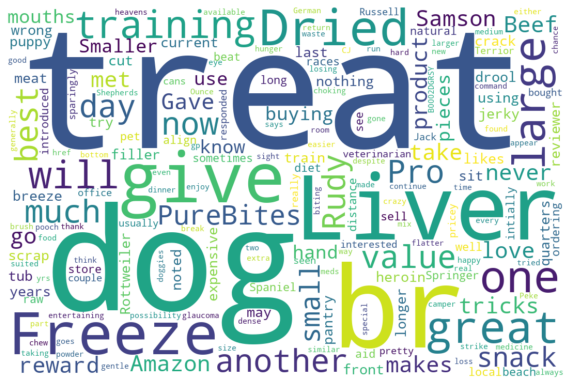

cluster:  3


Word Cloud for Important features


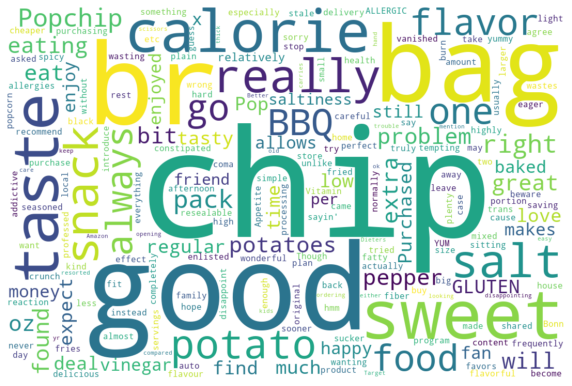

cluster:  4


Word Cloud for Important features


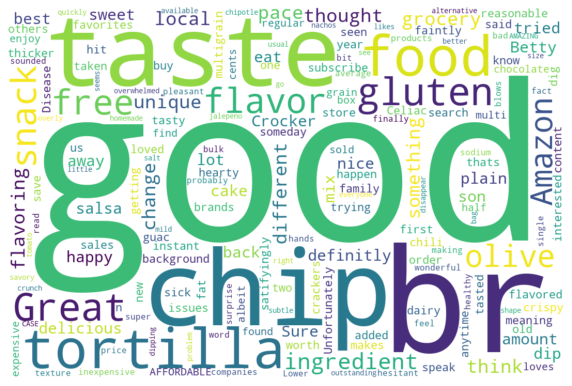

cluster:  5


Word Cloud for Important features


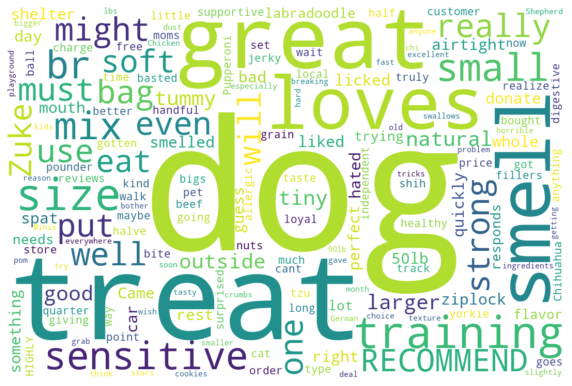

cluster:  6


Word Cloud for Important features


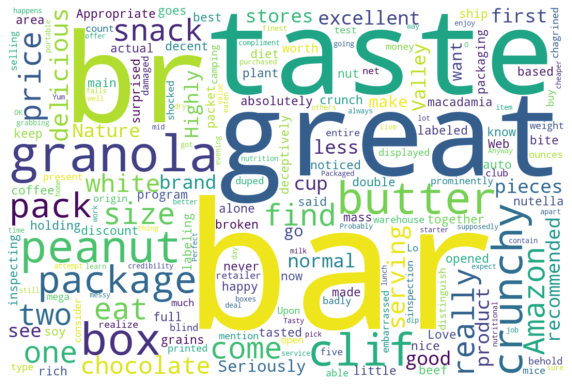

cluster:  7


Word Cloud for Important features


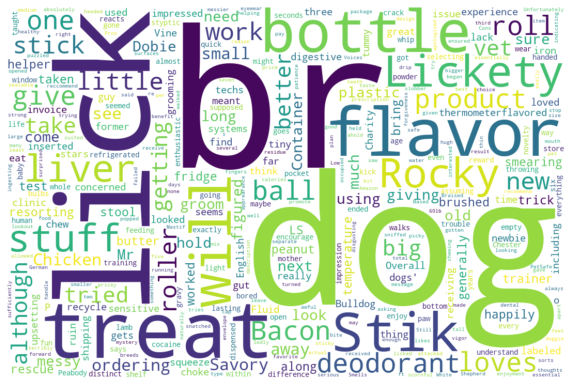

cluster:  8


Word Cloud for Important features


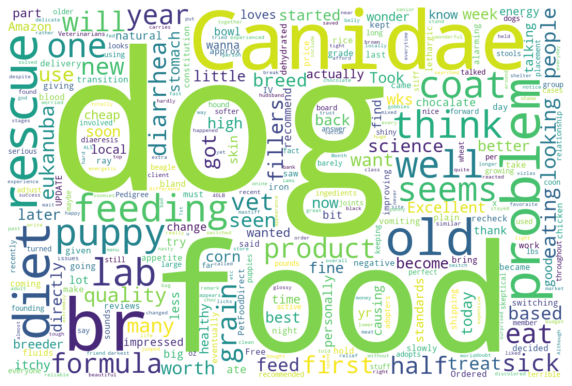

cluster:  9


Word Cloud for Important features


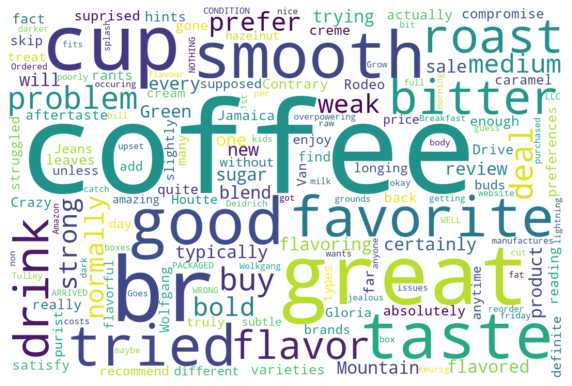

cluster:  10


Word Cloud for Important features


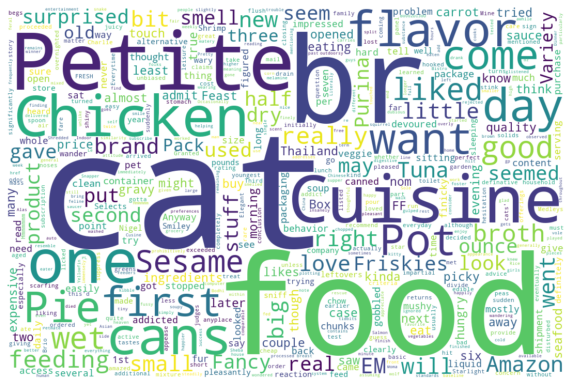

cluster:  11


Word Cloud for Important features


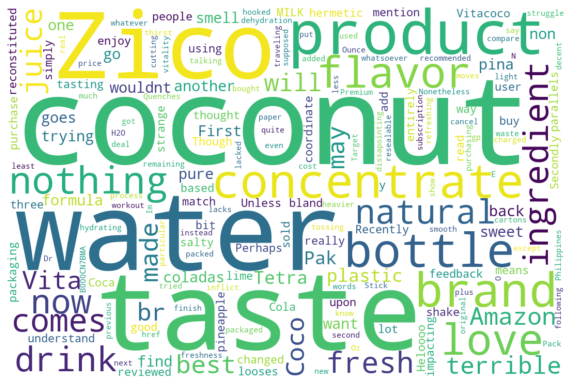

cluster:  12


Word Cloud for Important features


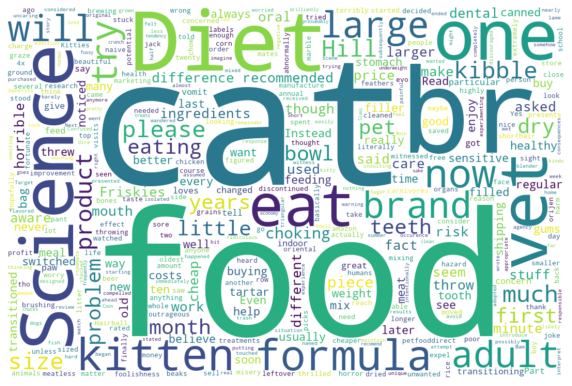

cluster:  13


Word Cloud for Important features


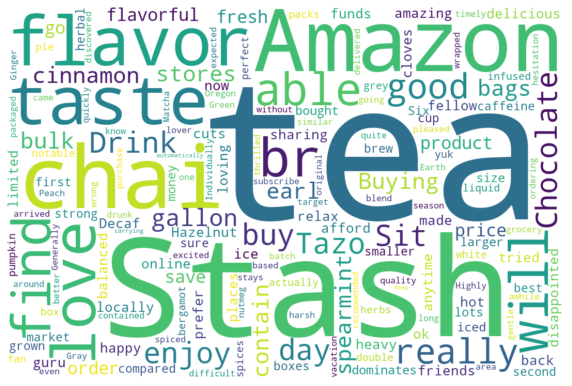

cluster:  14


Word Cloud for Important features


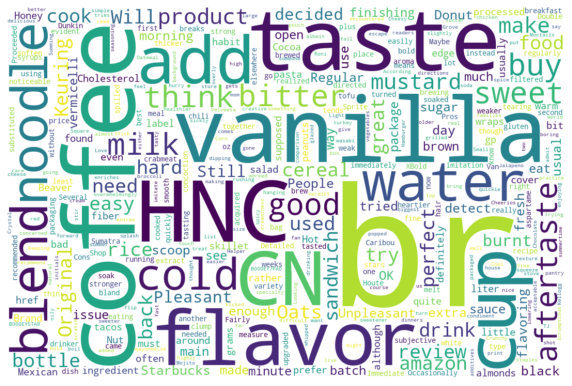

cluster:  15


Word Cloud for Important features


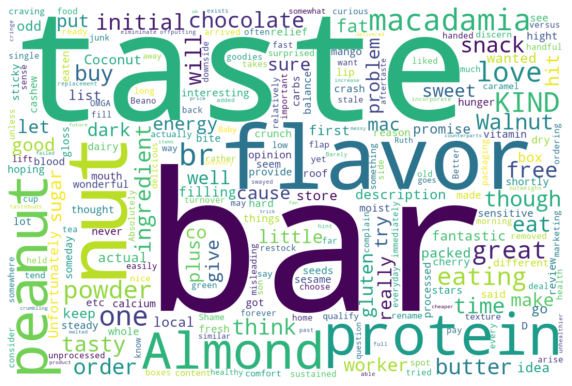

cluster:  16


Word Cloud for Important features


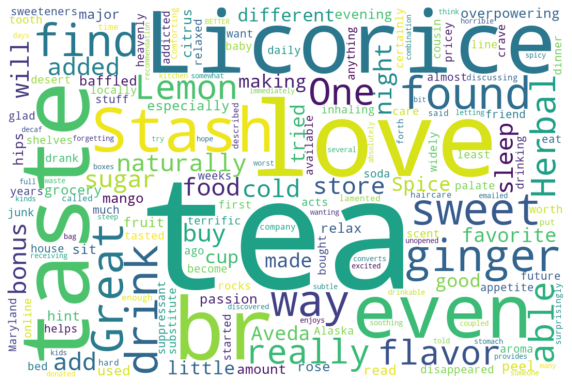

cluster:  17


Word Cloud for Important features


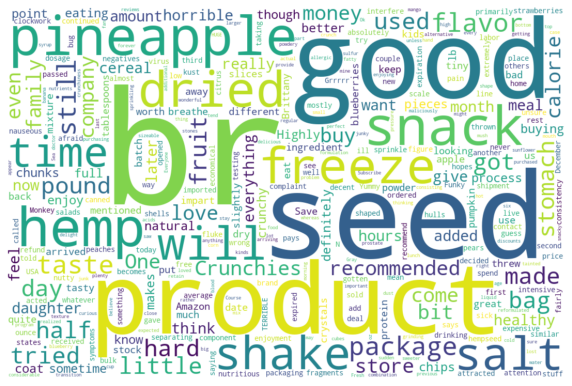

cluster:  18


Word Cloud for Important features


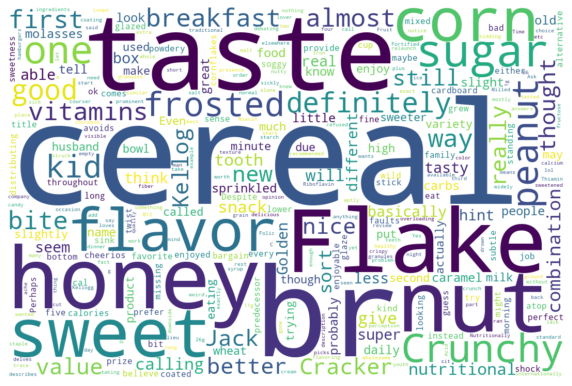

cluster:  19


Word Cloud for Important features


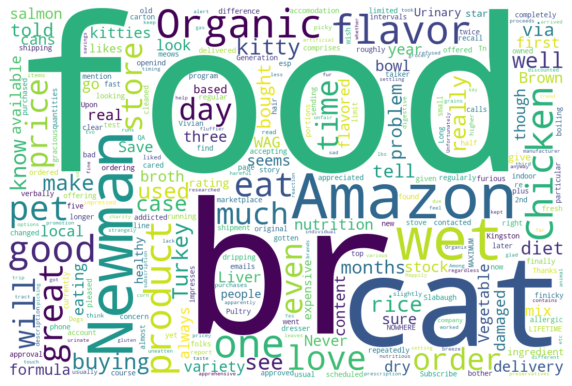

cluster:  20


Word Cloud for Important features


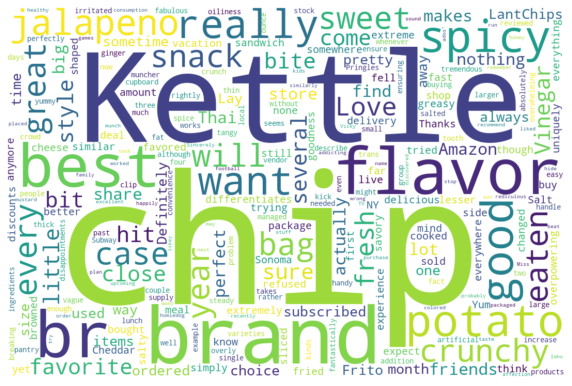

cluster:  21


Word Cloud for Important features


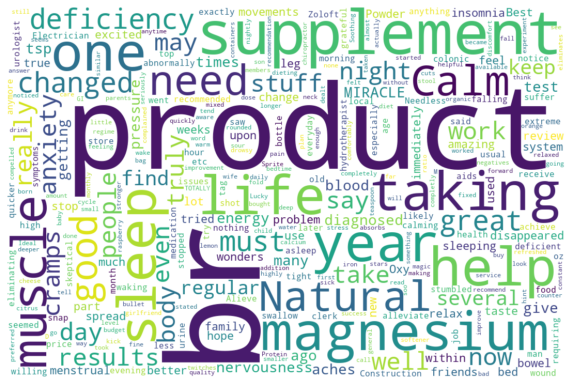

cluster:  22


Word Cloud for Important features


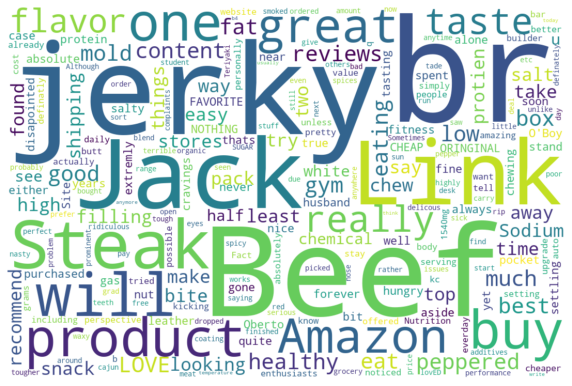

cluster:  23


Word Cloud for Important features


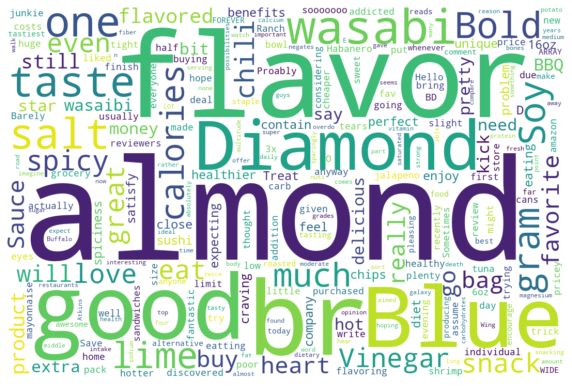

cluster:  24


Word Cloud for Important features


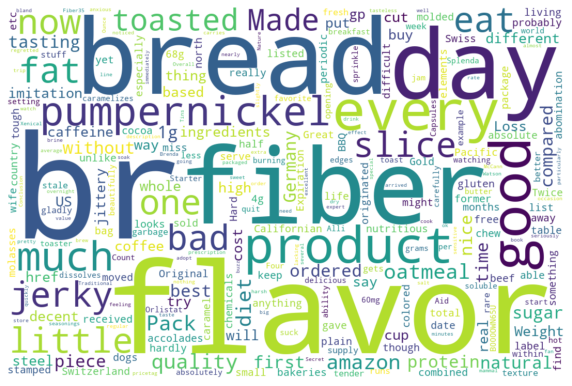

cluster:  25


Word Cloud for Important features


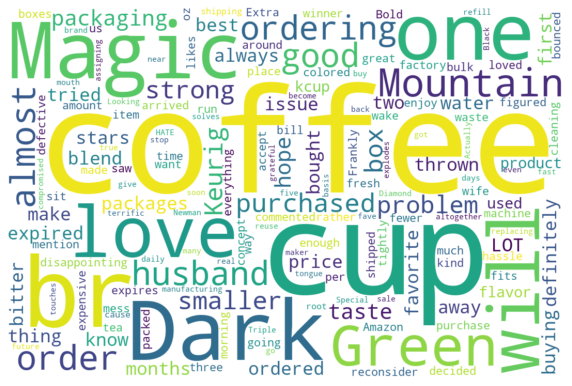

cluster:  26


Word Cloud for Important features


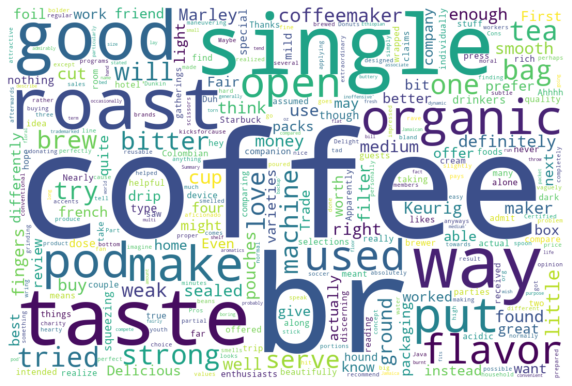

cluster:  27


Word Cloud for Important features


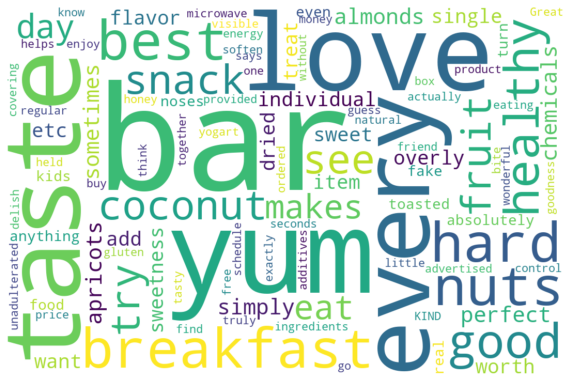

cluster:  28


Word Cloud for Important features


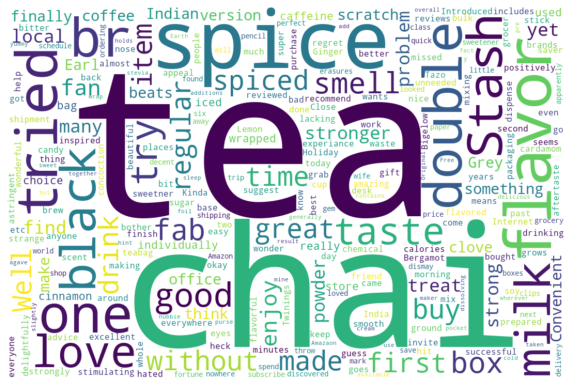

cluster:  29


Word Cloud for Important features


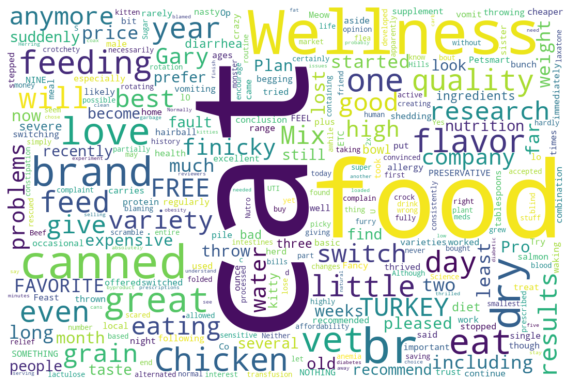

cluster:  30


Word Cloud for Important features


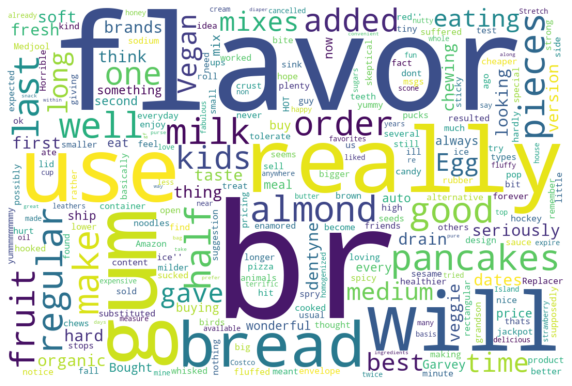

cluster:  31


Word Cloud for Important features


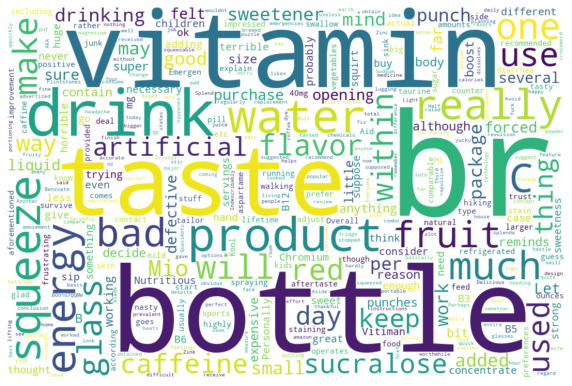

cluster:  32


Word Cloud for Important features


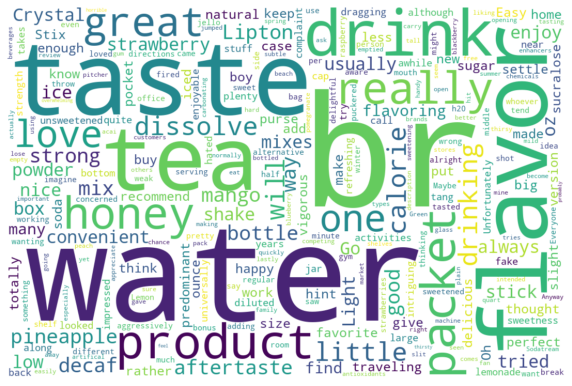

cluster:  33


Word Cloud for Important features


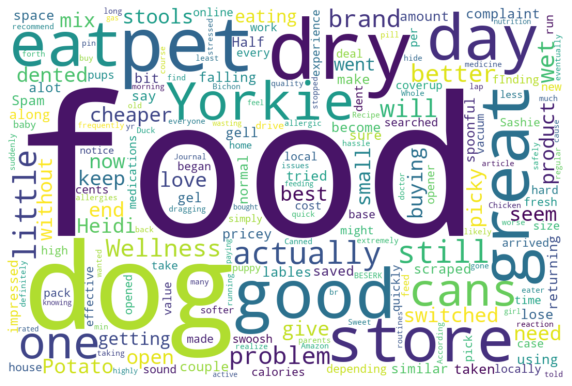

cluster:  34


Word Cloud for Important features


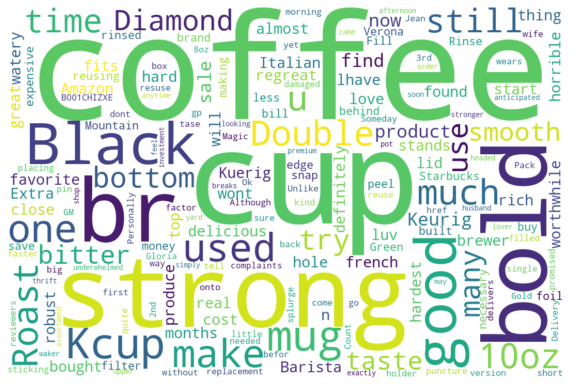

cluster:  35


Word Cloud for Important features


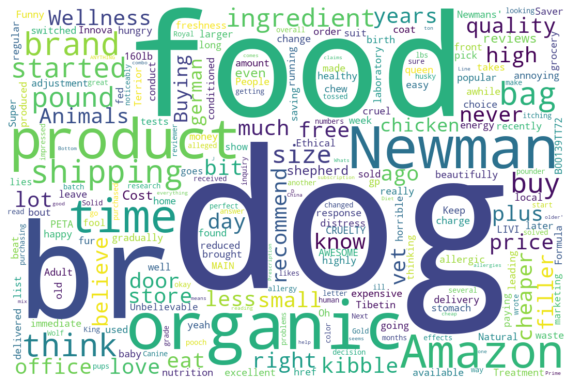

cluster:  36


Word Cloud for Important features


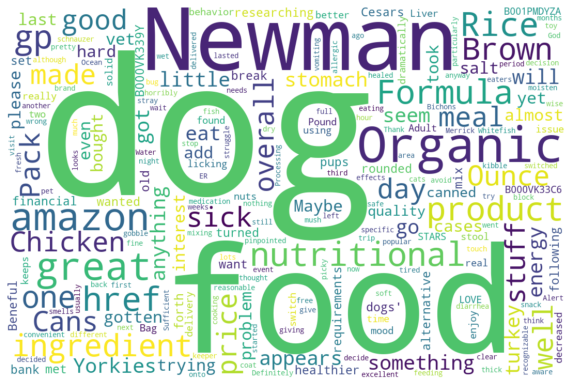

cluster:  37


Word Cloud for Important features


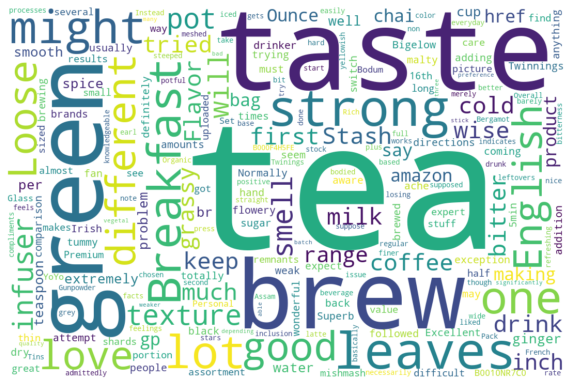

cluster:  38


Word Cloud for Important features


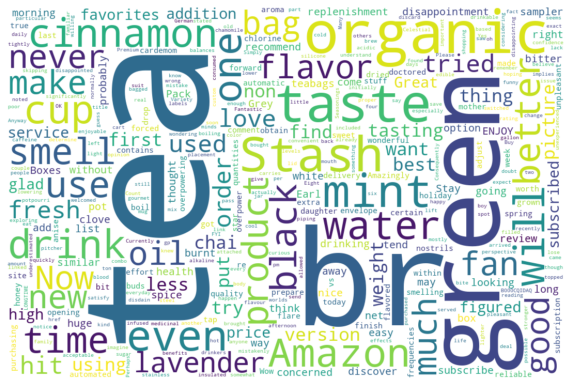

cluster:  39


Word Cloud for Important features


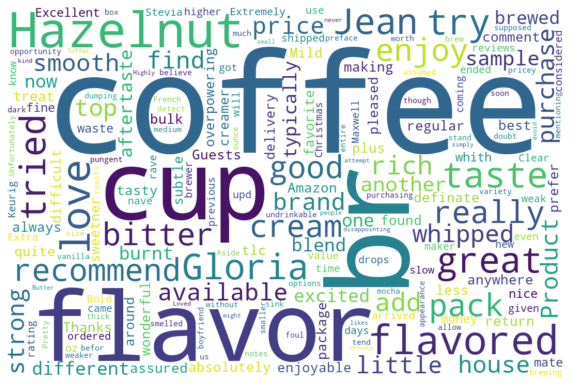

cluster:  40


Word Cloud for Important features


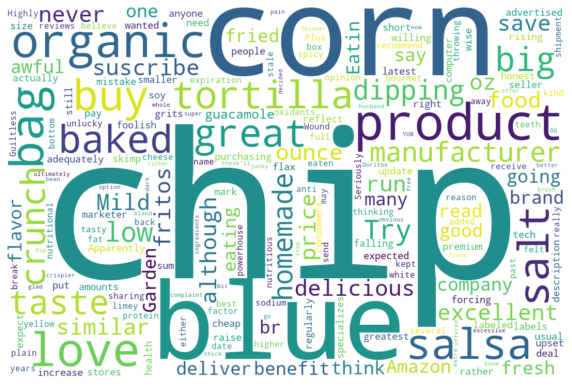

cluster:  41


Word Cloud for Important features


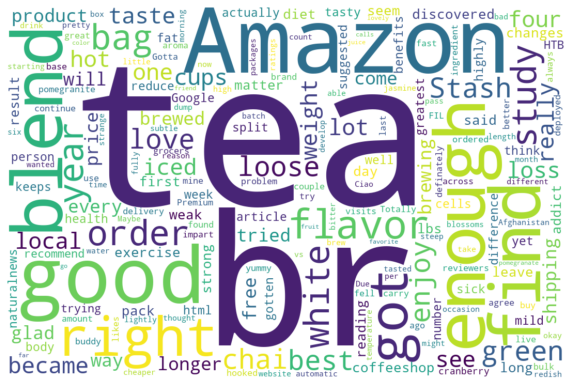

cluster:  42


Word Cloud for Important features


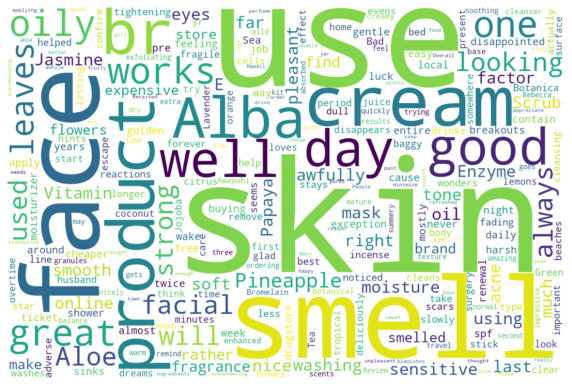

cluster:  43


Word Cloud for Important features


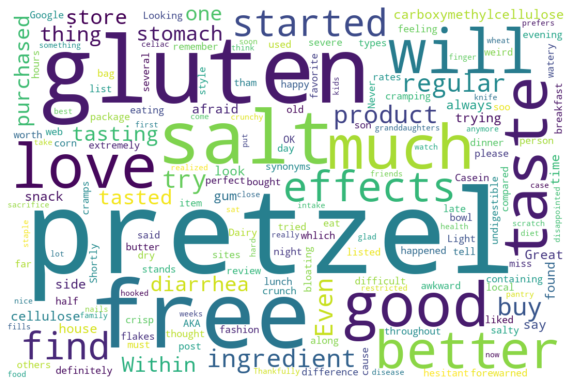

cluster:  44


Word Cloud for Important features


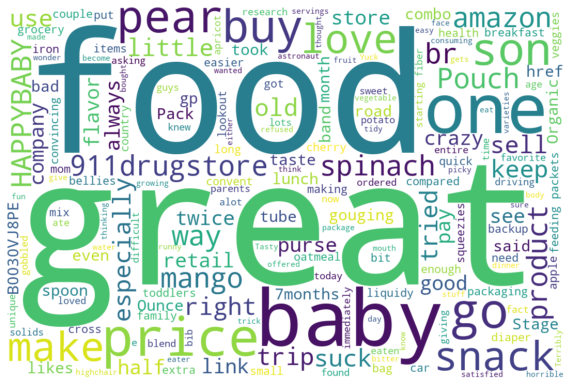

cluster:  45


Word Cloud for Important features


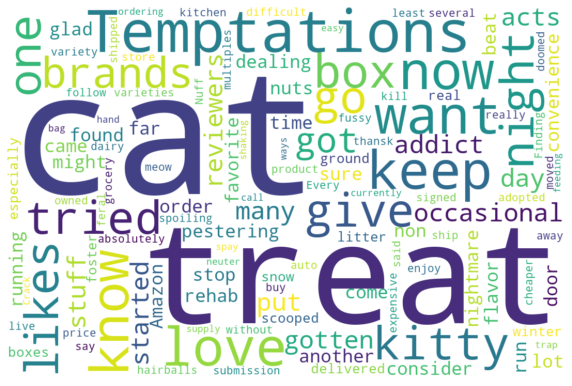

cluster:  46


Word Cloud for Important features


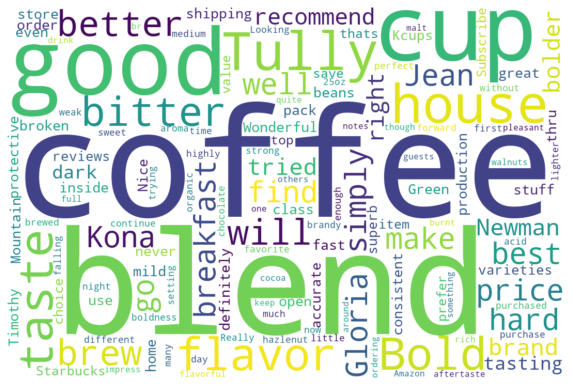

cluster:  47


Word Cloud for Important features


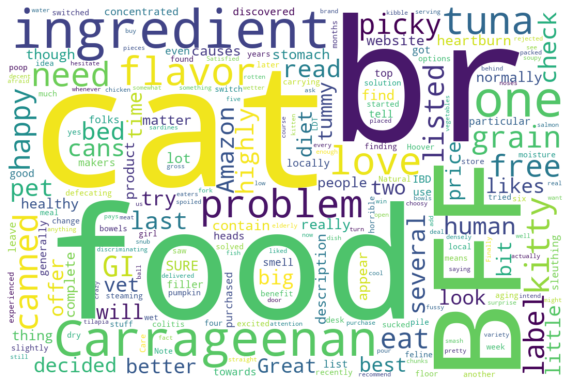

cluster:  48


Word Cloud for Important features


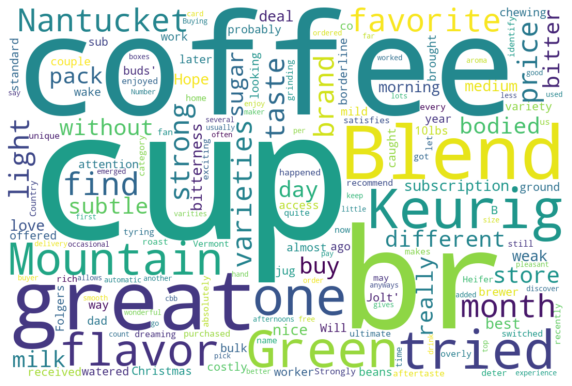

cluster:  49


Word Cloud for Important features


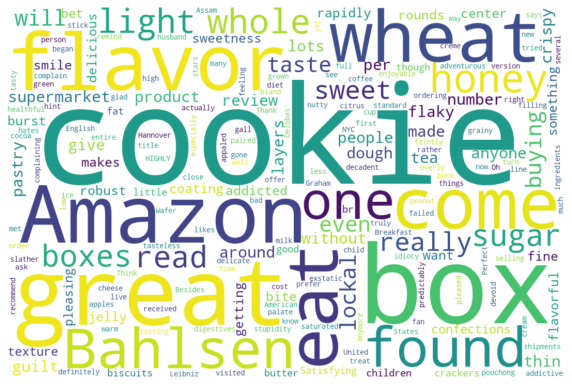

cluster:  50


Word Cloud for Important features


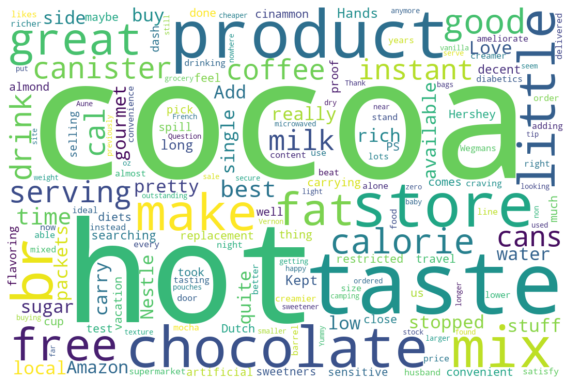

cluster:  51


Word Cloud for Important features


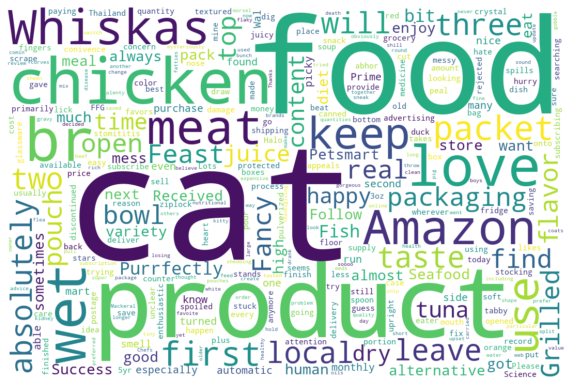

cluster:  52


Word Cloud for Important features


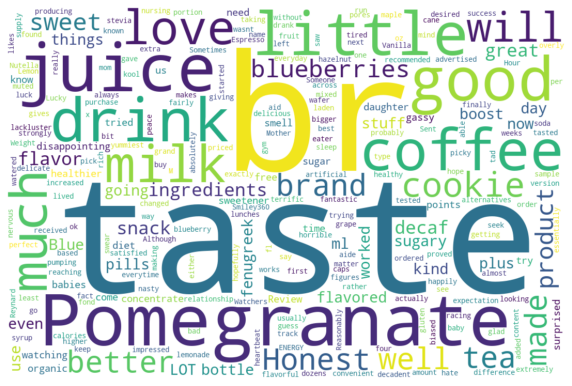

cluster:  53


Word Cloud for Important features


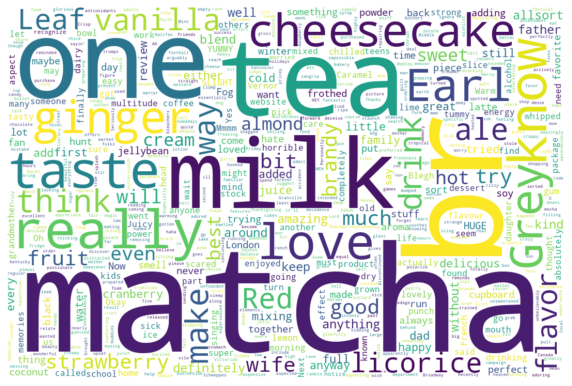

cluster:  54


Word Cloud for Important features


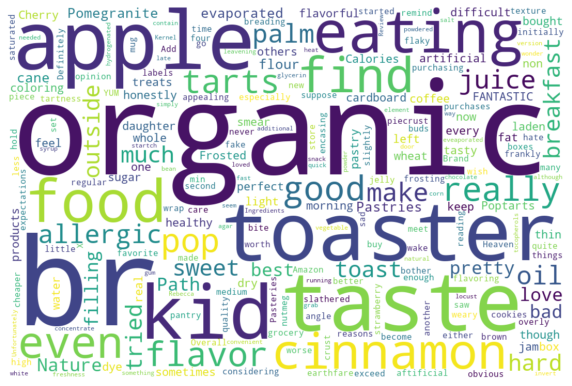

In [69]:
 """view word-cloud of each cluster **MAx 200 words** in (N-clusters = 1000) """
viz.wordcloud(10)

In [73]:
viz.gettopic(10)

Cluster 1 Topic:  Throat Relief Tea
Cluster 2 Topic:  freeze-dried liver treats
Cluster 3 Topic:  Potato chips
Cluster 4 Topic:  Chips
Cluster 5 Topic:  Dog treats
Cluster 6 Topic:  Cliff Bar White Chocolate Macademia Nut Granola Bars
Cluster 7 Topic:  a lickable pet treat
Cluster 8 Topic:  Canidae dog food
Cluster 9 Topic:  coffee
Cluster 10 Topic:  canned cat food
Cluster 11 Topic:  Vita Coco Coconut Water
Cluster 12 Topic:  A type of food for cats
Cluster 13 Topic:  black tea
Cluster 14 Topic:  trail mix
Cluster 15 Topic:  KIND PLUS Pomegranate Blueberry Pistachio bars
Cluster 16 Topic:  Licorice Spice Tea
Cluster 17 Topic:  Hemp Seed
Cluster 18 Topic:  Kellogg's Crunchy Nut cereal
Cluster 19 Topic:  Cat food
Cluster 20 Topic:  potato chips
Cluster 21 Topic:  a dietary supplement
Cluster 22 Topic:  Beef jerky
Cluster 23 Topic:  Blue Diamond Almonds
Cluster 24 Topic:  Beef Jerky
Cluster 25 Topic:  coffee
Cluster 26 Topic:  coffee pods
Cluster 27 Topic:  KIND Fruit and Nut bars
Cluste